In [1]:
# ---------------------------
# IMPORTS
# ---------------------------

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import os

In [2]:
# ---------------------------
# HYPERPARAMETERS
# ---------------------------

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

latent_dim = 100  # Dimensionality of the random noise vector z
batch_size = 64
#learning_rate = 3e-4
num_epochs = 150

# Feature maps = "hidden dimension" inside the Generator and Discriminator
# (how many channels / filters we use internally)
feature_map_gen = 64    # number of feature maps in Generator
feature_map_disc = 32   # number of feature maps in Discriminator

# MNIST specific settings
image_channels = 1  # Grayscale images: 1 channel
image_size = 28     # MNIST images are 28x28

# Path for saving TensorBoard logs
log_dir = "./runs/DCGAN_MNIST"
os.makedirs(log_dir, exist_ok=True)
writer = SummaryWriter(log_dir=log_dir)



In [3]:
# ---------------------------
# DATASET
# ---------------------------

# Transform: ToTensor + Normalize to [-1, 1] because Generator uses Tanh
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

print("Loading MNIST dataset...")
dataset = torchvision.datasets.MNIST(root='./dataset', train=True, transform=transform, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

Loading MNIST dataset...


In [4]:
# ---------------------------
# GENERATOR MODEL
# ---------------------------

# Residual Block
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(channels, channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(channels)
        )

    def forward(self, x):
        return nn.functional.relu(self.block(x) + x)

# Generator with Residual Blocks
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.init_size = 7
        self.l1 = nn.Sequential(
            nn.Linear(latent_dim, feature_map_gen * self.init_size * self.init_size)
        )

        self.model = nn.Sequential(
            nn.BatchNorm1d(feature_map_gen * self.init_size * self.init_size),
            nn.ReLU(inplace=True),
            nn.Unflatten(1, (feature_map_gen, self.init_size, self.init_size)),

            ResidualBlock(feature_map_gen),  # Residual block at 7x7

            # Upsample 7x7 → 14x14
            nn.ConvTranspose2d(feature_map_gen, feature_map_gen // 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(feature_map_gen // 2),
            nn.ReLU(inplace=True),

            ResidualBlock(feature_map_gen // 2),  # Residual block at 14x14

            # Upsample 14x14 → 28x28
            nn.ConvTranspose2d(feature_map_gen // 2, image_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, z):
        out = self.l1(z)
        out = self.model(out)
        return out




In [5]:
# ---------------------------
# DISCRIMINATOR
# ---------------------------

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            # 28x28 -> 14x14
            nn.Conv2d(image_channels, feature_map_disc, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(feature_map_disc),
            nn.LeakyReLU(0.2, inplace=True),

            # 14x14 -> 7x7
            nn.Conv2d(feature_map_disc, feature_map_disc * 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(feature_map_disc * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # 7x7 -> 4x4
            nn.Conv2d(feature_map_disc * 2, feature_map_disc * 4, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(feature_map_disc * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Flatten(),
            nn.Linear(feature_map_disc * 4 * 4 * 4, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        return self.model(img)



In [6]:
# ---------------------------
# MODEL SETUP
# ---------------------------

G = Generator().to(device)
D = Discriminator().to(device)

criterion = nn.BCELoss()  # Binary Cross Entropy Loss

optimizer_G = optim.Adam(G.parameters(), lr=4e-4, betas=(0.5, 0.999)) #Faster lr for G since D was dominating
optimizer_D = optim.Adam(D.parameters(), lr=2e-4, betas=(0.5, 0.999))


In [7]:
# ---------------------------
# UTILITY FUNCTIONS
# ---------------------------

def sample_images(epoch):
    """Generate and save sample images every few epochs."""
    z = torch.randn(64, latent_dim).to(device)
    fake_imgs = G(z).cpu().detach()
    grid = torchvision.utils.make_grid(fake_imgs, nrow=8, normalize=True)

    writer.add_image('Generated Images', grid, global_step=epoch)

    plt.figure(figsize=(8, 8))
    plt.title(f"Generated Images at Epoch {epoch}")
    plt.imshow(grid.permute(1, 2, 0))
    plt.axis('off')
    plt.show()

In [8]:
# ---------------------------
# FOLDERS FOR SAVING MODELS
# ---------------------------

save_dir = "./saved_models"
os.makedirs(save_dir, exist_ok=True)  # Create folder if it doesn't exist


In [11]:
# TensorBoard setup
%load_ext tensorboard
%tensorboard --logdir=runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 56337), started 1:02:48 ago. (Use '!kill 56337' to kill it.)

<IPython.core.display.Javascript object>

Starting training...
Epoch [1/150]  Loss D: 0.9629, Loss G: 1.7451
Saved Best Generator at Epoch 1 with G Loss 1.7451


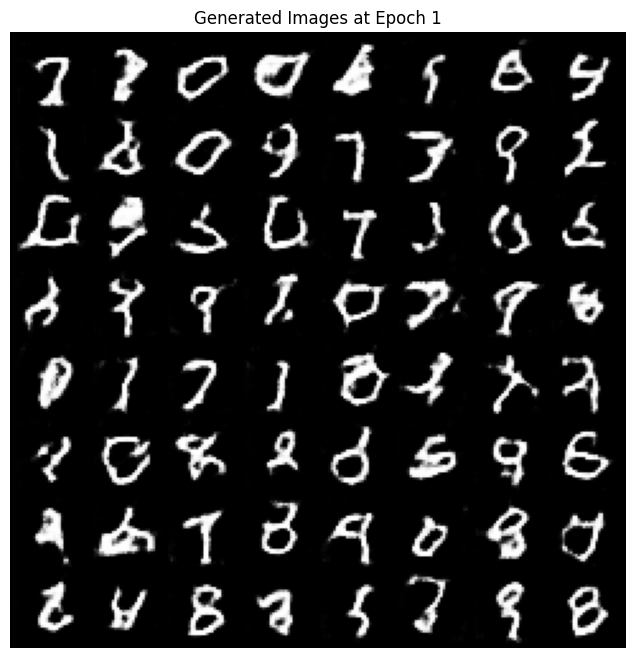

Epoch [2/150]  Loss D: 1.0661, Loss G: 1.3357
Saved Best Generator at Epoch 2 with G Loss 1.3357
Epoch [3/150]  Loss D: 1.1229, Loss G: 1.2733
Saved Best Generator at Epoch 3 with G Loss 1.2733
Epoch [4/150]  Loss D: 1.1462, Loss G: 1.2461
Saved Best Generator at Epoch 4 with G Loss 1.2461
Epoch [5/150]  Loss D: 1.1550, Loss G: 1.2423
Saved Best Generator at Epoch 5 with G Loss 1.2423


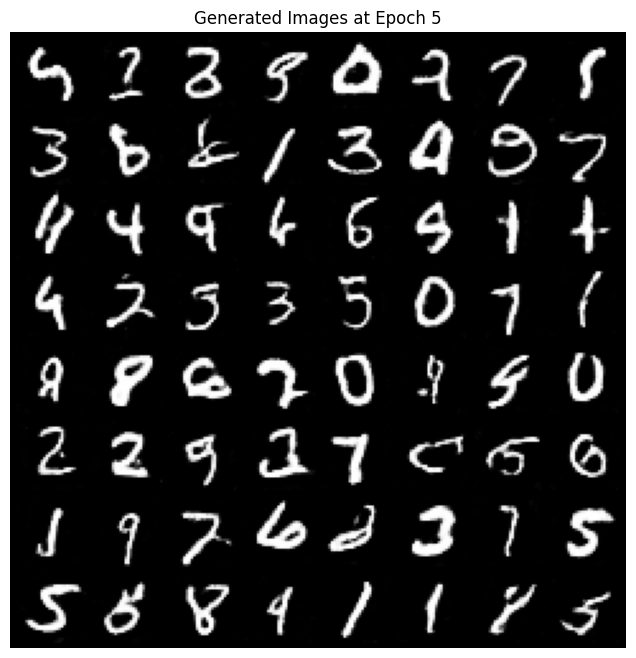

Epoch [6/150]  Loss D: 1.1635, Loss G: 1.2424
Epoch [7/150]  Loss D: 1.1701, Loss G: 1.2432
Epoch [8/150]  Loss D: 1.1810, Loss G: 1.2276
Saved Best Generator at Epoch 8 with G Loss 1.2276
Epoch [9/150]  Loss D: 1.1958, Loss G: 1.2117
Saved Best Generator at Epoch 9 with G Loss 1.2117
Epoch [10/150]  Loss D: 1.1971, Loss G: 1.2045
Saved Best Generator at Epoch 10 with G Loss 1.2045


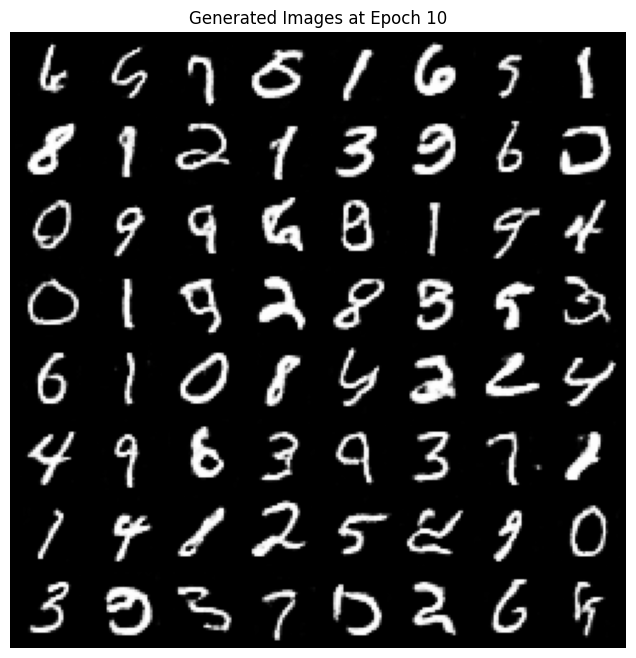

Epoch [11/150]  Loss D: 1.2013, Loss G: 1.2019
Saved Best Generator at Epoch 11 with G Loss 1.2019
Epoch [12/150]  Loss D: 1.2007, Loss G: 1.2026
Epoch [13/150]  Loss D: 1.2010, Loss G: 1.2056
Epoch [14/150]  Loss D: 1.2068, Loss G: 1.1992
Saved Best Generator at Epoch 14 with G Loss 1.1992
Epoch [15/150]  Loss D: 1.2043, Loss G: 1.1990
Saved Best Generator at Epoch 15 with G Loss 1.1990


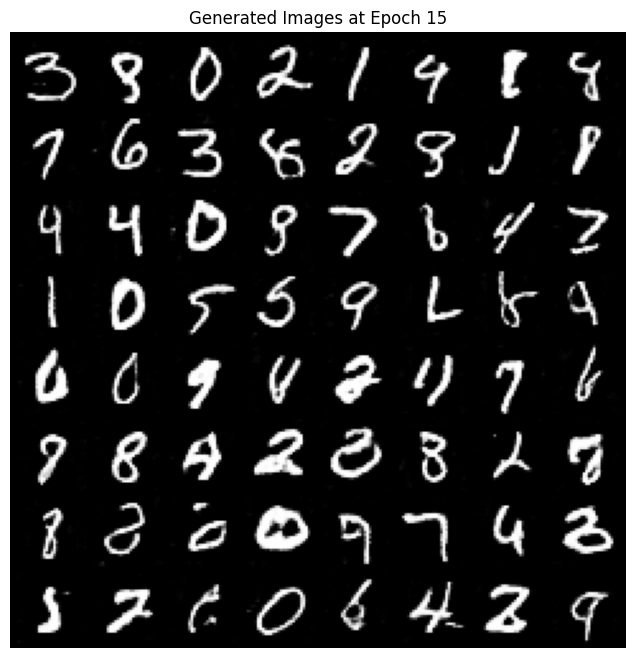

Epoch [16/150]  Loss D: 1.2049, Loss G: 1.2058
Epoch [17/150]  Loss D: 1.2008, Loss G: 1.2044
Epoch [18/150]  Loss D: 1.1982, Loss G: 1.2194
Epoch [19/150]  Loss D: 1.1929, Loss G: 1.2205
Epoch [20/150]  Loss D: 1.1927, Loss G: 1.2249


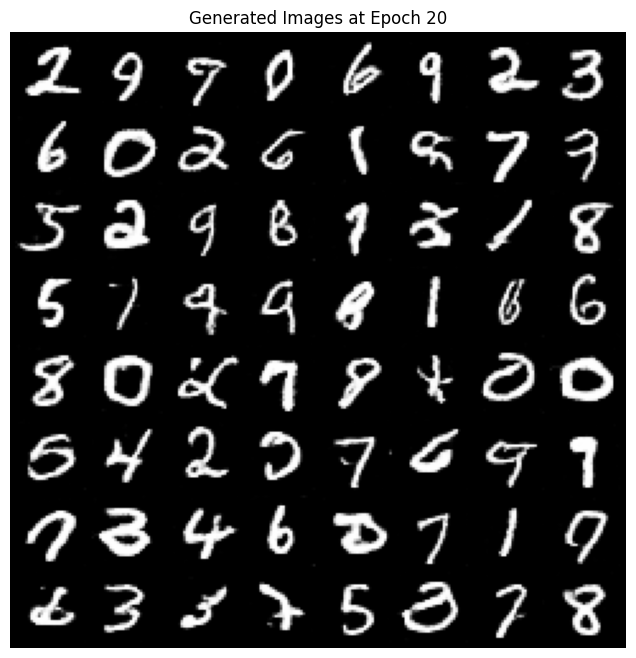

Epoch [21/150]  Loss D: 1.1899, Loss G: 1.2299
Epoch [22/150]  Loss D: 1.1821, Loss G: 1.2441
Epoch [23/150]  Loss D: 1.1824, Loss G: 1.2500
Epoch [24/150]  Loss D: 1.1787, Loss G: 1.2475
Epoch [25/150]  Loss D: 1.1798, Loss G: 1.2550


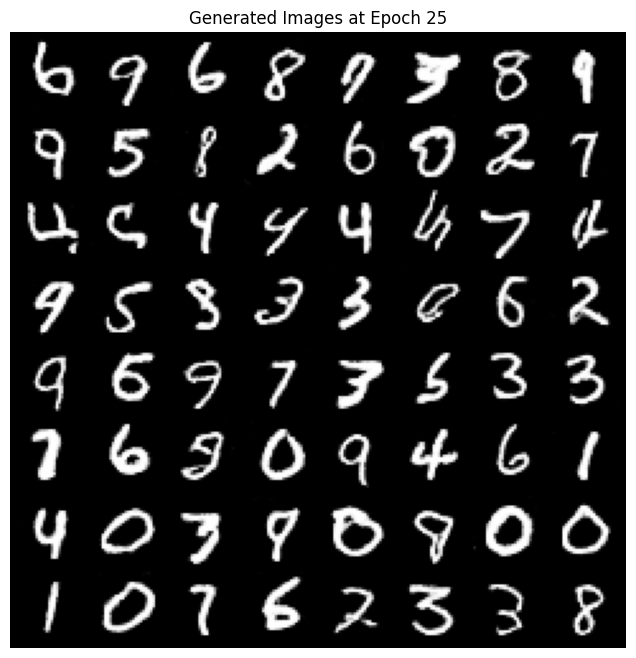

Epoch [26/150]  Loss D: 1.1725, Loss G: 1.2602
Epoch [27/150]  Loss D: 1.1725, Loss G: 1.2694
Epoch [28/150]  Loss D: 1.1716, Loss G: 1.2665
Epoch [29/150]  Loss D: 1.1643, Loss G: 1.2805
Epoch [30/150]  Loss D: 1.1570, Loss G: 1.2911


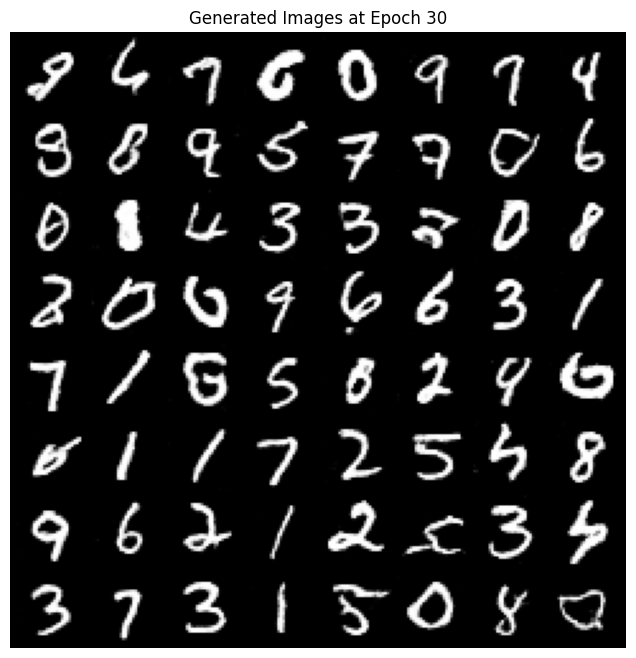

Epoch [31/150]  Loss D: 1.1530, Loss G: 1.2987
Epoch [32/150]  Loss D: 1.1504, Loss G: 1.3066
Epoch [33/150]  Loss D: 1.1482, Loss G: 1.3115
Epoch [34/150]  Loss D: 1.1448, Loss G: 1.3146
Epoch [35/150]  Loss D: 1.1325, Loss G: 1.3291


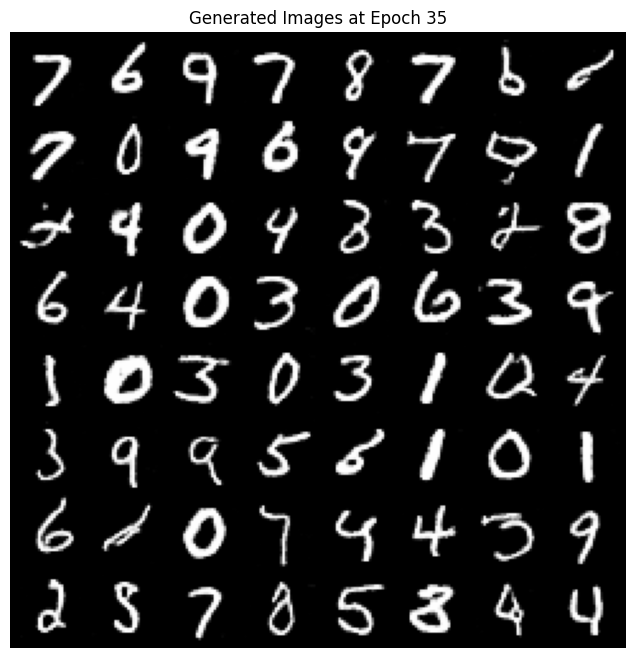

Epoch [36/150]  Loss D: 1.1276, Loss G: 1.3436
Epoch [37/150]  Loss D: 1.1236, Loss G: 1.3467
Epoch [38/150]  Loss D: 1.1242, Loss G: 1.3524
Epoch [39/150]  Loss D: 1.1197, Loss G: 1.3615
Epoch [40/150]  Loss D: 1.1090, Loss G: 1.3767


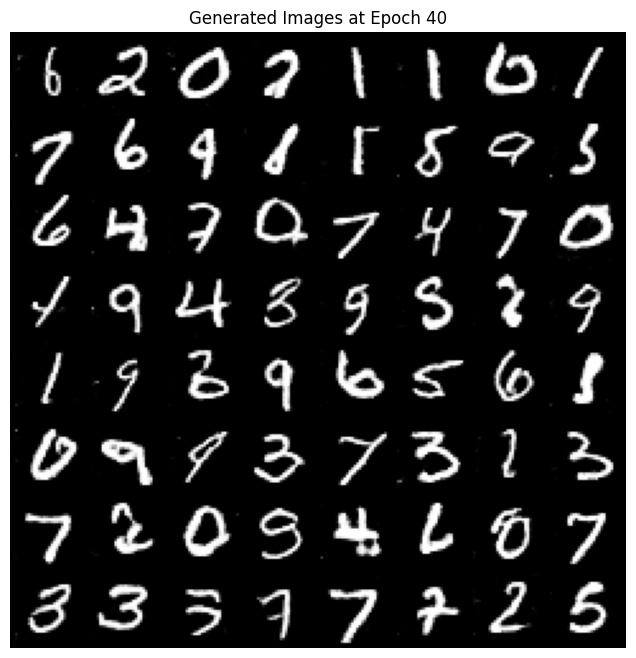

Epoch [41/150]  Loss D: 1.1079, Loss G: 1.3797
Epoch [42/150]  Loss D: 1.1034, Loss G: 1.3878
Epoch [43/150]  Loss D: 1.1002, Loss G: 1.3958
Epoch [44/150]  Loss D: 1.0998, Loss G: 1.3996
Epoch [45/150]  Loss D: 1.0883, Loss G: 1.4157


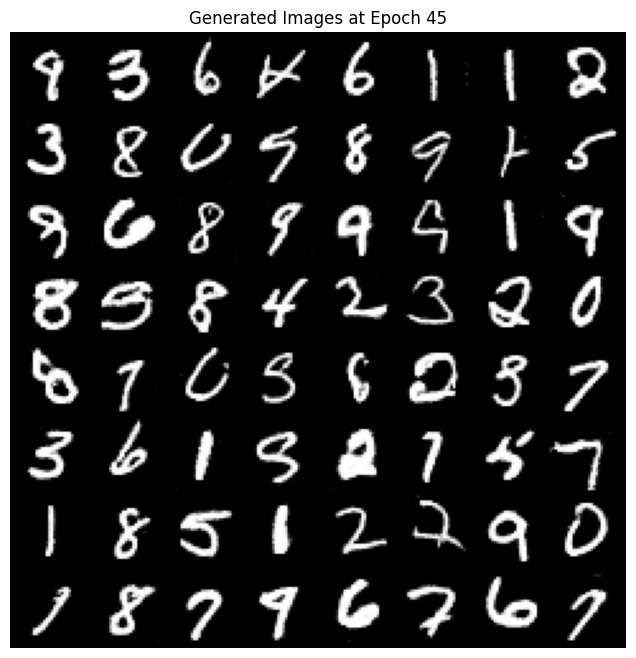

Epoch [46/150]  Loss D: 1.0844, Loss G: 1.4207
Epoch [47/150]  Loss D: 1.0798, Loss G: 1.4316
Epoch [48/150]  Loss D: 1.0723, Loss G: 1.4441
Epoch [49/150]  Loss D: 1.0600, Loss G: 1.4653
Epoch [50/150]  Loss D: 1.0570, Loss G: 1.4782


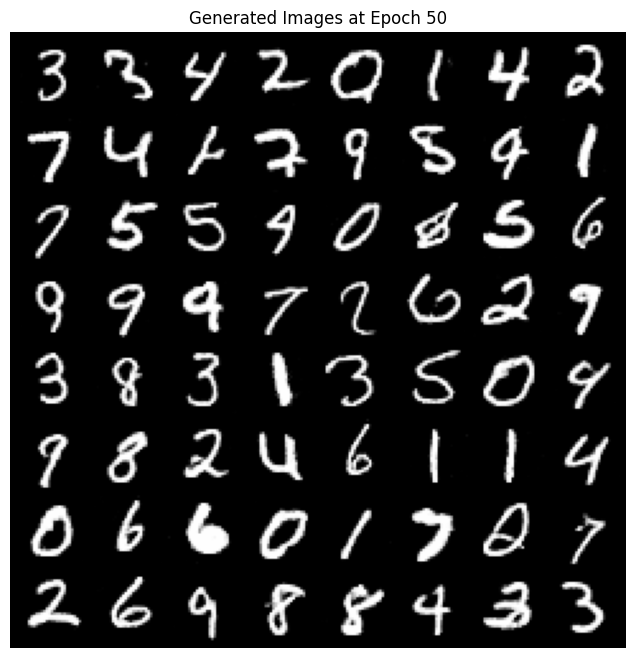

Epoch [51/150]  Loss D: 1.0567, Loss G: 1.4759
Epoch [52/150]  Loss D: 1.0470, Loss G: 1.4947
Epoch [53/150]  Loss D: 1.0442, Loss G: 1.5044
Epoch [54/150]  Loss D: 1.0416, Loss G: 1.5110
Epoch [55/150]  Loss D: 1.0360, Loss G: 1.5188


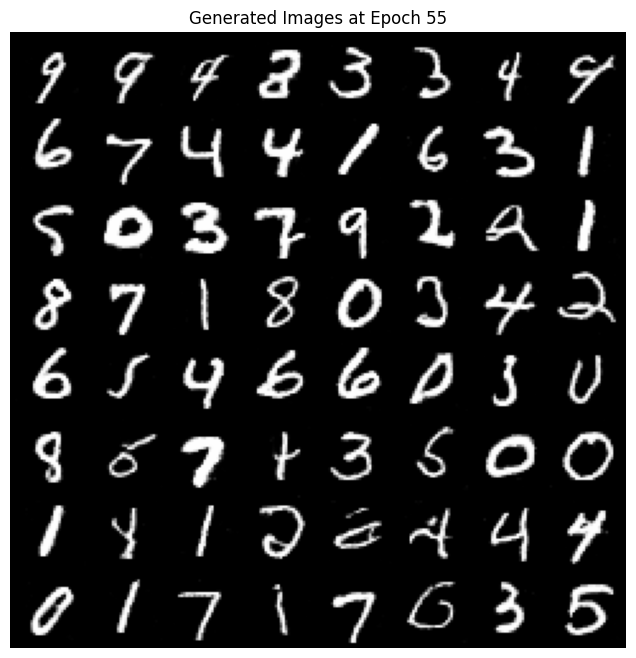

Epoch [56/150]  Loss D: 1.0263, Loss G: 1.5415
Epoch [57/150]  Loss D: 1.0243, Loss G: 1.5423
Epoch [58/150]  Loss D: 1.0122, Loss G: 1.5636
Epoch [59/150]  Loss D: 1.0031, Loss G: 1.5878
Epoch [60/150]  Loss D: 0.9983, Loss G: 1.5888


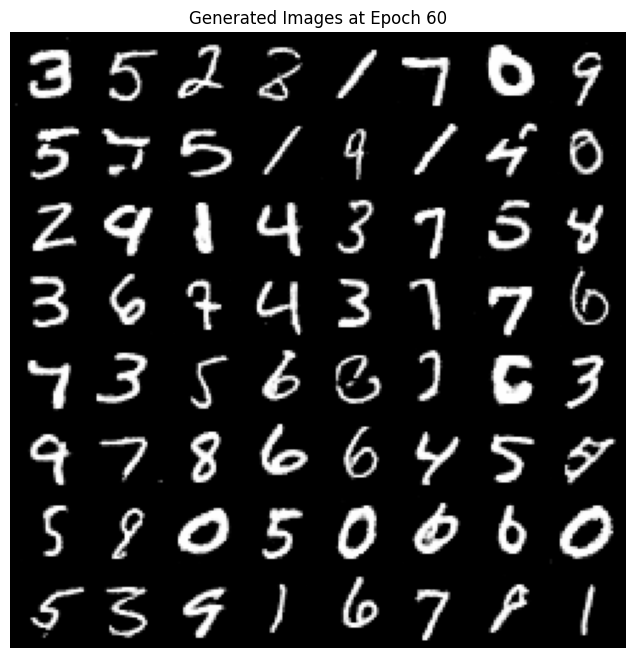

Epoch [61/150]  Loss D: 1.0025, Loss G: 1.5929
Epoch [62/150]  Loss D: 0.9901, Loss G: 1.6105
Epoch [63/150]  Loss D: 0.9890, Loss G: 1.6232
Epoch [64/150]  Loss D: 0.9793, Loss G: 1.6254
Epoch [65/150]  Loss D: 0.9777, Loss G: 1.6374


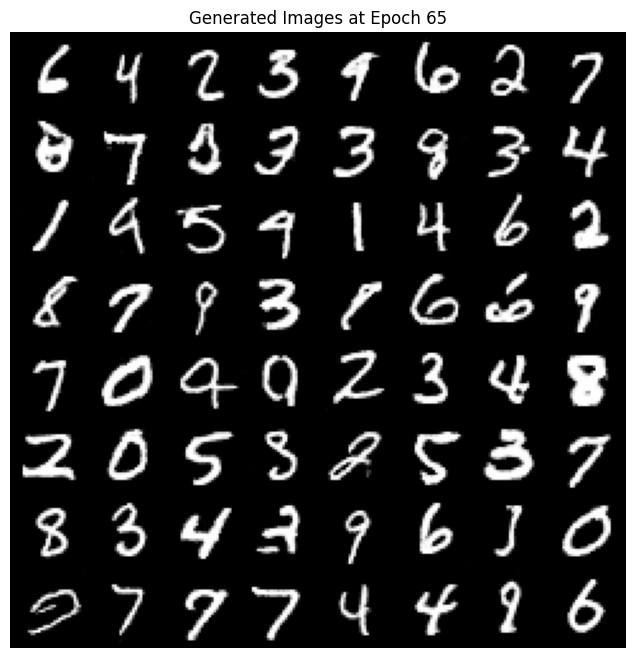

Epoch [66/150]  Loss D: 0.9767, Loss G: 1.6459
Epoch [67/150]  Loss D: 0.9635, Loss G: 1.6673
Epoch [68/150]  Loss D: 0.9541, Loss G: 1.6783
Epoch [69/150]  Loss D: 0.9547, Loss G: 1.6913
Epoch [70/150]  Loss D: 0.9424, Loss G: 1.7076


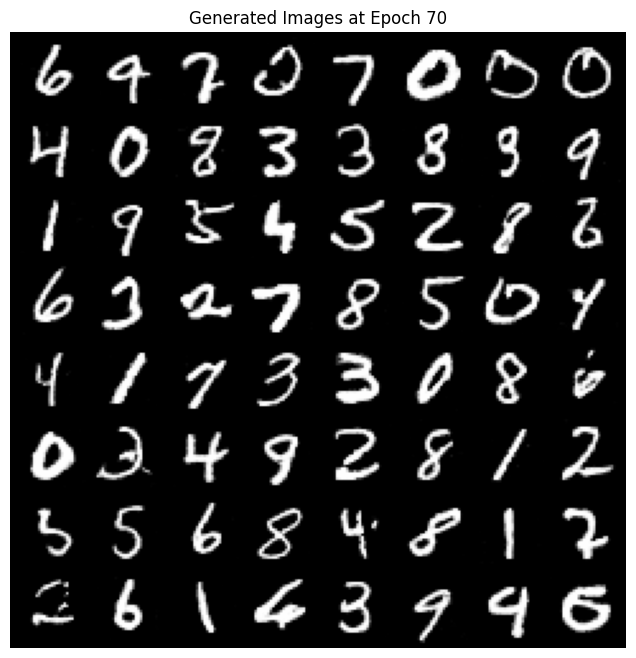

Epoch [71/150]  Loss D: 0.9543, Loss G: 1.6998
Epoch [72/150]  Loss D: 0.9357, Loss G: 1.7229
Epoch [73/150]  Loss D: 0.9353, Loss G: 1.7297
Epoch [74/150]  Loss D: 0.9316, Loss G: 1.7440
Epoch [75/150]  Loss D: 0.9266, Loss G: 1.7470


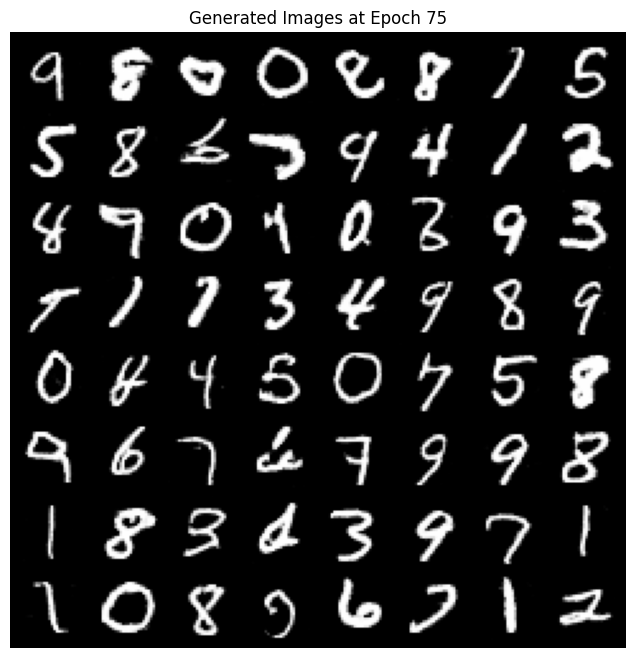

Epoch [76/150]  Loss D: 0.9149, Loss G: 1.7783
Epoch [77/150]  Loss D: 0.9124, Loss G: 1.7867
Epoch [78/150]  Loss D: 0.9118, Loss G: 1.7841
Epoch [79/150]  Loss D: 0.9065, Loss G: 1.7984
Epoch [80/150]  Loss D: 0.9014, Loss G: 1.8115


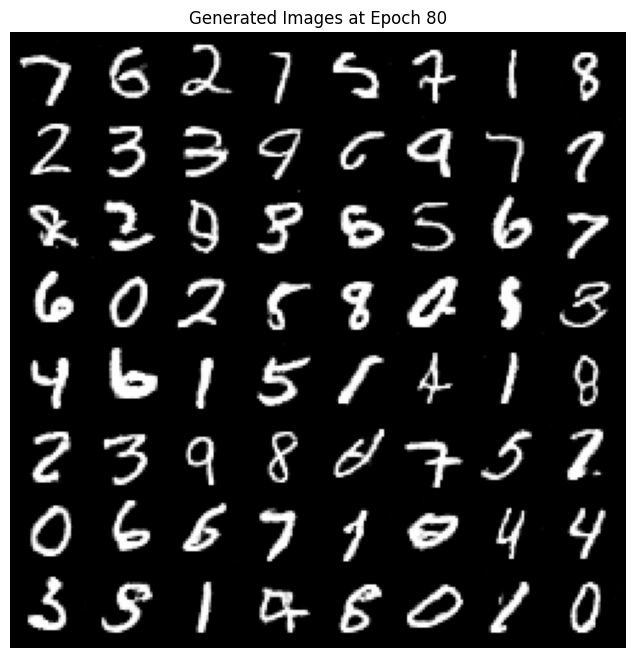

Epoch [81/150]  Loss D: 0.8997, Loss G: 1.8217
Epoch [82/150]  Loss D: 0.8933, Loss G: 1.8278
Epoch [83/150]  Loss D: 0.8813, Loss G: 1.8503
Epoch [84/150]  Loss D: 0.8828, Loss G: 1.8628
Epoch [85/150]  Loss D: 0.8814, Loss G: 1.8567


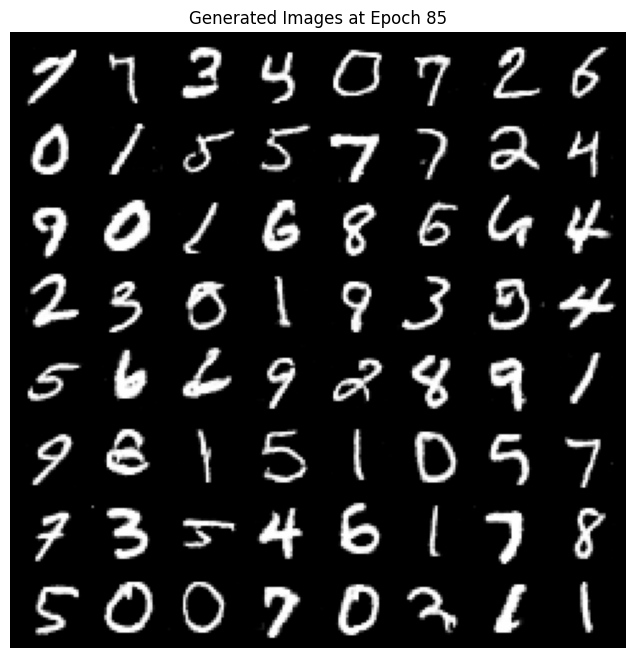

Epoch [86/150]  Loss D: 0.8731, Loss G: 1.8770
Epoch [87/150]  Loss D: 0.8685, Loss G: 1.8884
Epoch [88/150]  Loss D: 0.8623, Loss G: 1.9046
Epoch [89/150]  Loss D: 0.8685, Loss G: 1.8999
Epoch [90/150]  Loss D: 0.8665, Loss G: 1.9061


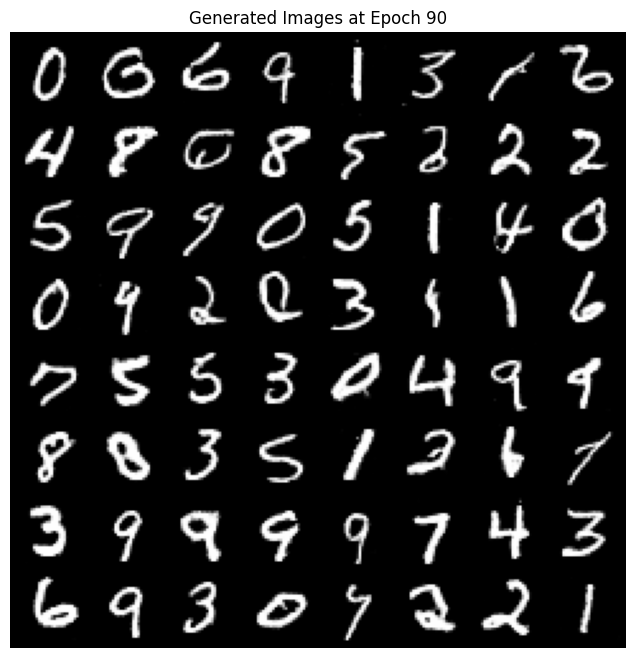

Epoch [91/150]  Loss D: 0.8455, Loss G: 1.9333
Epoch [92/150]  Loss D: 0.8465, Loss G: 1.9437
Epoch [93/150]  Loss D: 0.8405, Loss G: 1.9710
Epoch [94/150]  Loss D: 0.8440, Loss G: 1.9576
Epoch [95/150]  Loss D: 0.8447, Loss G: 1.9500


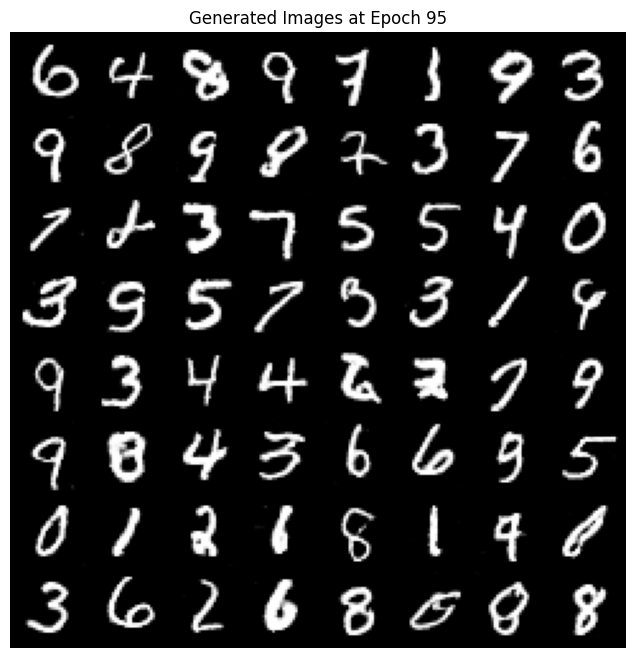

Epoch [96/150]  Loss D: 0.8314, Loss G: 1.9819
Epoch [97/150]  Loss D: 0.8329, Loss G: 1.9822
Epoch [98/150]  Loss D: 0.8273, Loss G: 1.9950
Epoch [99/150]  Loss D: 0.8175, Loss G: 2.0120
Epoch [100/150]  Loss D: 0.8199, Loss G: 2.0165


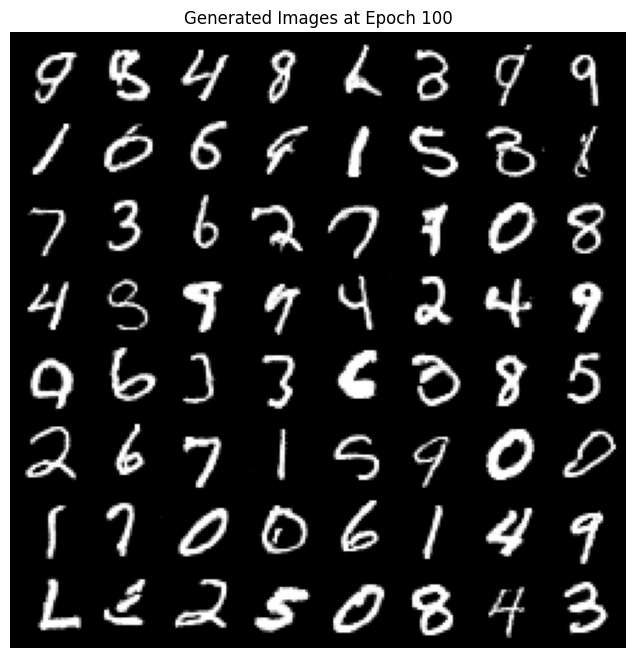

Epoch [101/150]  Loss D: 0.8131, Loss G: 2.0283
Epoch [102/150]  Loss D: 0.8050, Loss G: 2.0512
Epoch [103/150]  Loss D: 0.8111, Loss G: 2.0455
Epoch [104/150]  Loss D: 0.7963, Loss G: 2.0675
Epoch [105/150]  Loss D: 0.7950, Loss G: 2.0838


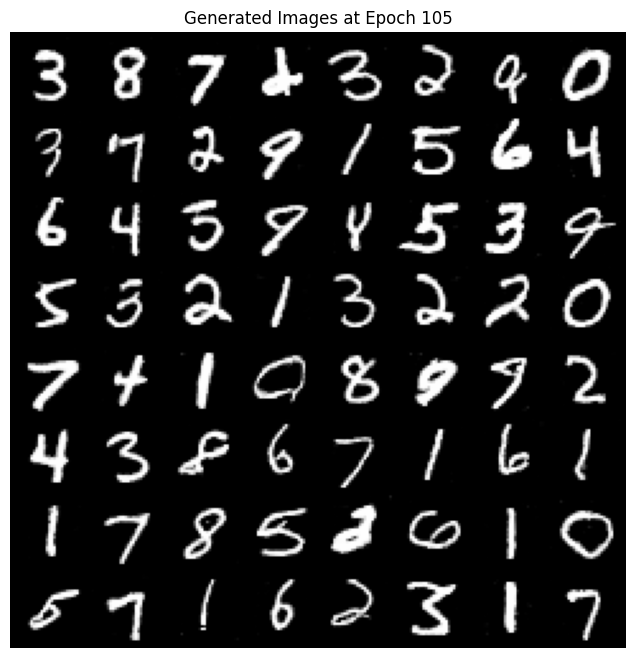

Epoch [106/150]  Loss D: 0.7884, Loss G: 2.0916
Epoch [107/150]  Loss D: 0.7946, Loss G: 2.0918
Epoch [108/150]  Loss D: 0.7883, Loss G: 2.0969
Epoch [109/150]  Loss D: 0.7808, Loss G: 2.1175
Epoch [110/150]  Loss D: 0.7782, Loss G: 2.1238


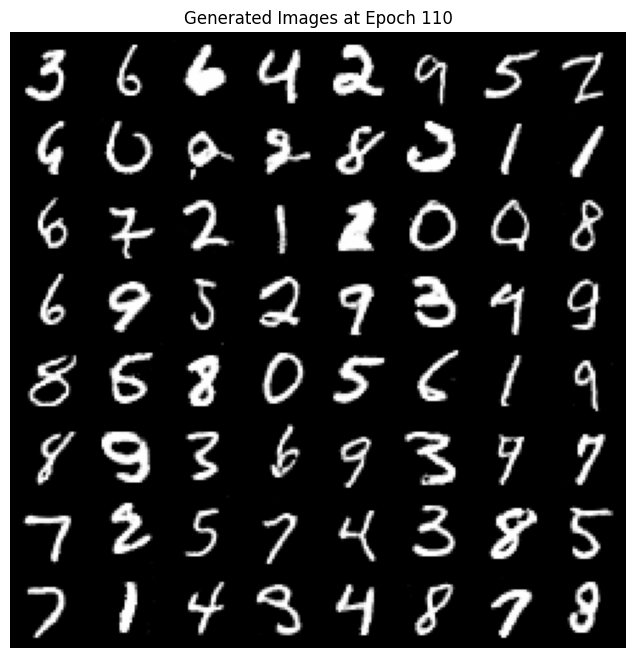

Epoch [111/150]  Loss D: 0.7830, Loss G: 2.1099
Epoch [112/150]  Loss D: 0.7751, Loss G: 2.1413
Epoch [113/150]  Loss D: 0.7658, Loss G: 2.1712
Epoch [114/150]  Loss D: 0.7617, Loss G: 2.1684
Epoch [115/150]  Loss D: 0.7697, Loss G: 2.1559


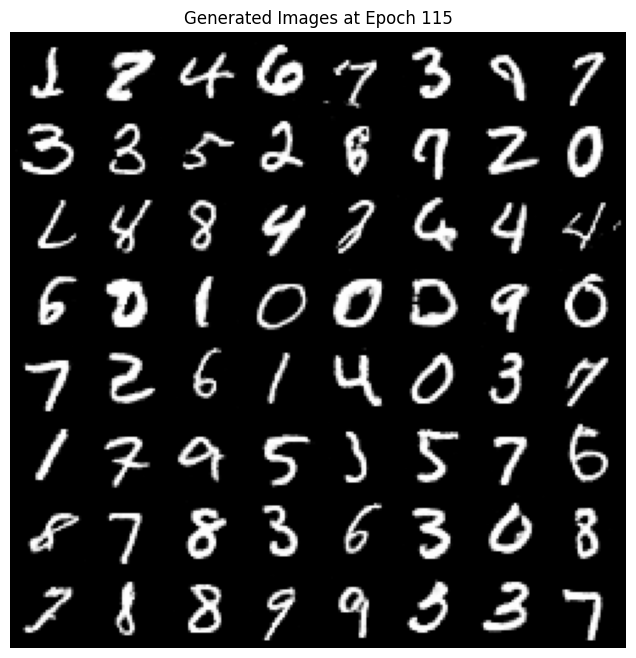

Epoch [116/150]  Loss D: 0.7552, Loss G: 2.1824
Epoch [117/150]  Loss D: 0.7433, Loss G: 2.2064
Epoch [118/150]  Loss D: 0.7577, Loss G: 2.1926
Epoch [119/150]  Loss D: 0.7495, Loss G: 2.2192
Epoch [120/150]  Loss D: 0.7459, Loss G: 2.2221


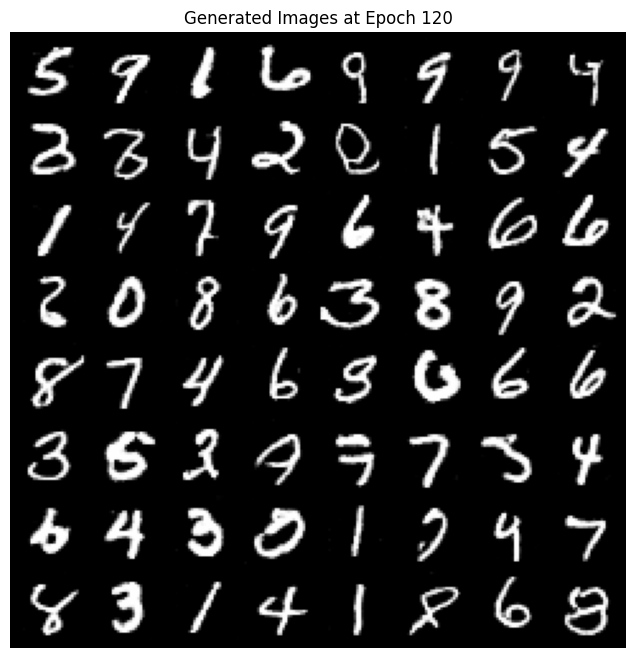

Epoch [121/150]  Loss D: 0.7437, Loss G: 2.2416
Epoch [122/150]  Loss D: 0.7403, Loss G: 2.2375
Epoch [123/150]  Loss D: 0.7369, Loss G: 2.2522
Epoch [124/150]  Loss D: 0.7276, Loss G: 2.2675
Epoch [125/150]  Loss D: 0.7373, Loss G: 2.2555


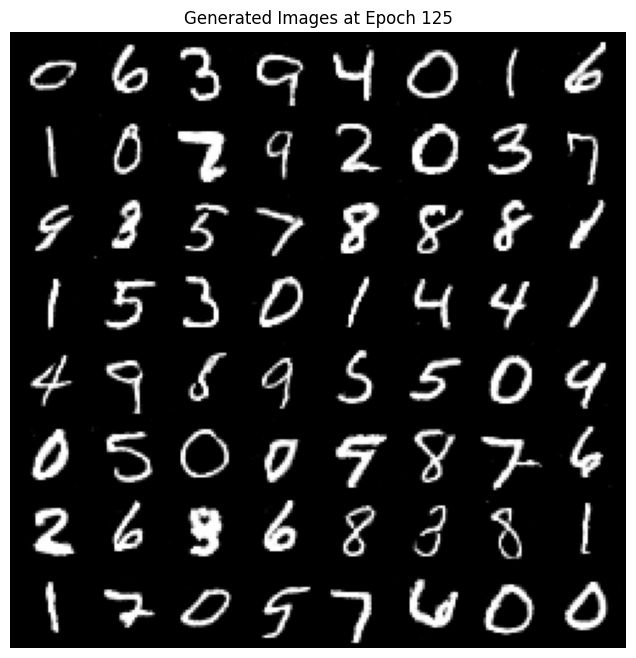

Epoch [126/150]  Loss D: 0.7216, Loss G: 2.2826
Epoch [127/150]  Loss D: 0.7246, Loss G: 2.2811
Epoch [128/150]  Loss D: 0.7329, Loss G: 2.2904
Epoch [129/150]  Loss D: 0.7242, Loss G: 2.2840
Epoch [130/150]  Loss D: 0.7239, Loss G: 2.2959


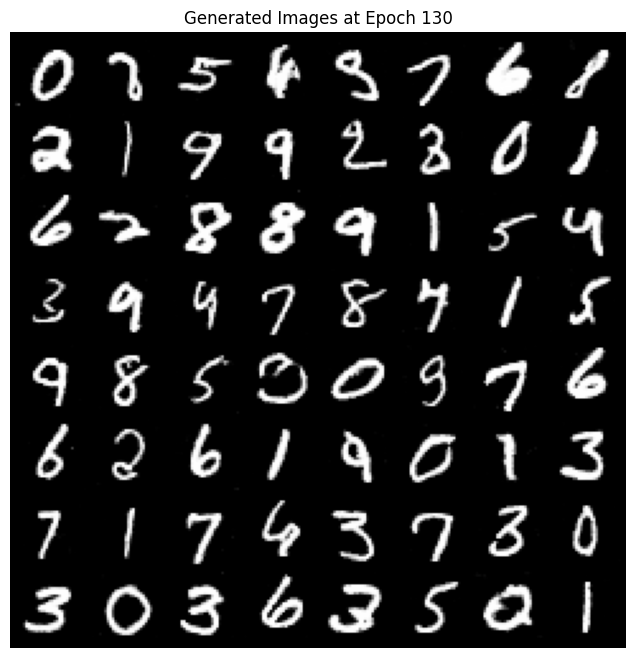

Epoch [131/150]  Loss D: 0.7170, Loss G: 2.3110
Epoch [132/150]  Loss D: 0.7133, Loss G: 2.3312
Epoch [133/150]  Loss D: 0.7039, Loss G: 2.3414
Epoch [134/150]  Loss D: 0.7083, Loss G: 2.3514
Epoch [135/150]  Loss D: 0.7032, Loss G: 2.3529


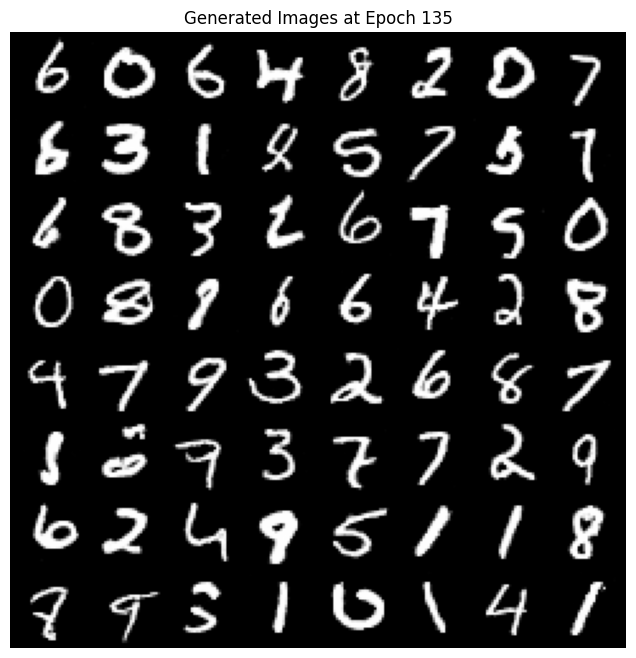

Epoch [136/150]  Loss D: 0.7042, Loss G: 2.3473
Epoch [137/150]  Loss D: 0.6960, Loss G: 2.3816
Epoch [138/150]  Loss D: 0.6988, Loss G: 2.3763
Epoch [139/150]  Loss D: 0.6973, Loss G: 2.3883
Epoch [140/150]  Loss D: 0.6867, Loss G: 2.4071


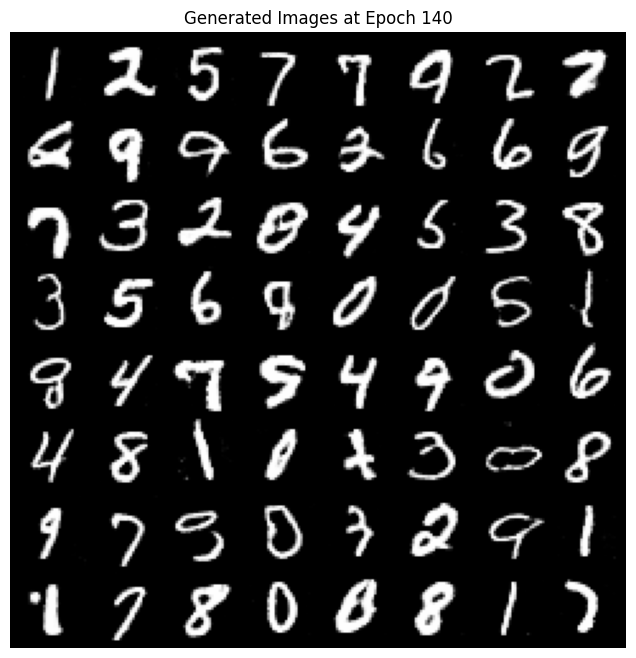

Epoch [141/150]  Loss D: 0.6933, Loss G: 2.4065
Epoch [142/150]  Loss D: 0.6869, Loss G: 2.4131
Epoch [143/150]  Loss D: 0.6780, Loss G: 2.4328
Epoch [144/150]  Loss D: 0.6826, Loss G: 2.4512
Epoch [145/150]  Loss D: 0.6744, Loss G: 2.4479


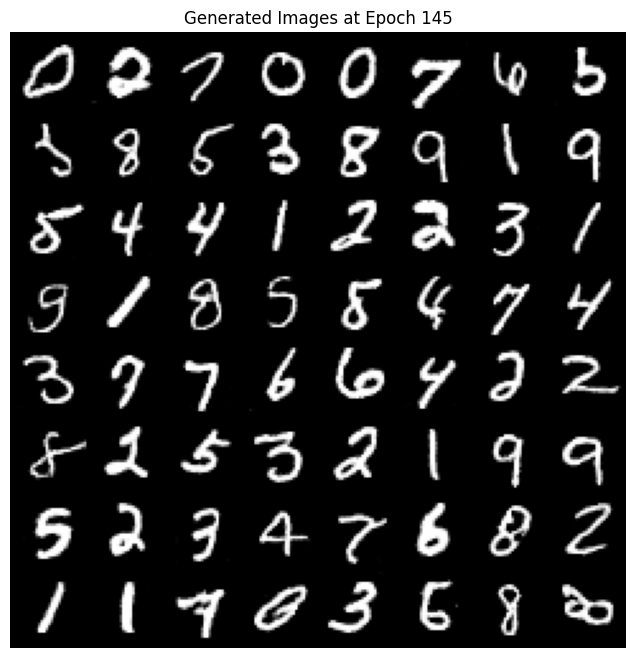

Epoch [146/150]  Loss D: 0.6798, Loss G: 2.4592
Epoch [147/150]  Loss D: 0.6638, Loss G: 2.4764
Epoch [148/150]  Loss D: 0.6777, Loss G: 2.4659
Epoch [149/150]  Loss D: 0.6613, Loss G: 2.4717
Epoch [150/150]  Loss D: 0.6729, Loss G: 2.4740


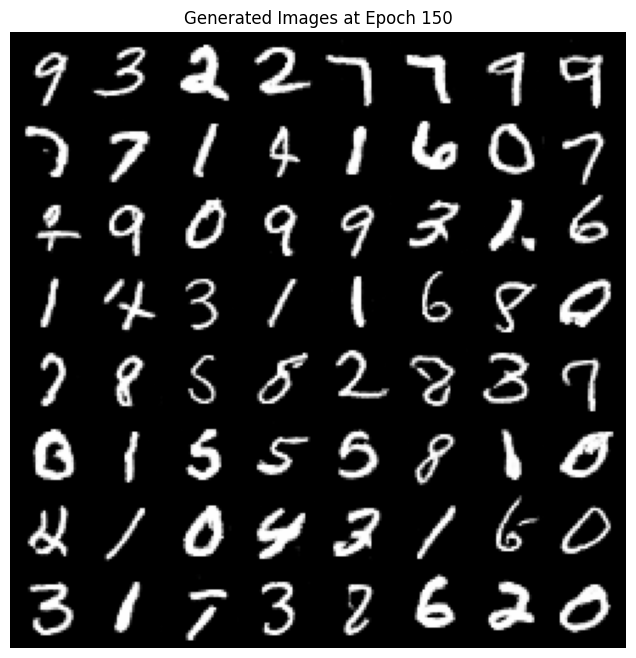

Training finished.


In [10]:

# ---------------------------
# TRAINING LOOP
# ---------------------------

print("Starting training...")

best_g_loss = float('inf')  # Initialize best loss as infinity

for epoch in range(1, num_epochs + 1):
    G.train()
    D.train()

    total_d_loss = 0
    total_g_loss = 0

    for batch_idx, (real_imgs, _) in enumerate(loader):
        real_imgs = real_imgs.to(device)
        batch_size_curr = real_imgs.size(0)

        real_labels = torch.ones(batch_size_curr, 1).to(device) * 0.9  # label smoothing
        fake_labels = torch.zeros(batch_size_curr, 1).to(device)

        # ---------------------
        # Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()

        real_outputs = D(real_imgs)
        d_real_loss = criterion(real_outputs, real_labels)

        z = torch.randn(batch_size_curr, latent_dim).to(device)
        fake_imgs = G(z)
        fake_outputs = D(fake_imgs.detach())
        d_fake_loss = criterion(fake_outputs, fake_labels)

        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        optimizer_D.step()

        # ---------------------
        # Train Generator
        # ---------------------
        optimizer_G.zero_grad()

        d_fake_preds = D(fake_imgs)
        real_labels_g = torch.ones(batch_size_curr, 1).to(device) #remove label smoothing for G
        g_loss = criterion(d_fake_preds, real_labels_g)  # G tries to fool D

        g_loss.backward()
        optimizer_G.step()

        total_d_loss += d_loss.item()
        total_g_loss += g_loss.item()

    avg_d_loss = total_d_loss / len(loader)
    avg_g_loss = total_g_loss / len(loader)

    print(f"Epoch [{epoch}/{num_epochs}]  Loss D: {avg_d_loss:.4f}, Loss G: {avg_g_loss:.4f}")

    writer.add_scalar('Loss/Discriminator', avg_d_loss, epoch)
    writer.add_scalar('Loss/Generator', avg_g_loss, epoch)

    # ---------------------------
    # Save Best Generator Model
    # ---------------------------
    if avg_g_loss < best_g_loss:
        best_g_loss = avg_g_loss
        best_generator_path = os.path.join(save_dir, f"best_generator_epoch{epoch}.pth")
        torch.save(G.state_dict(), best_generator_path)
        print(f"Saved Best Generator at Epoch {epoch} with G Loss {best_g_loss:.4f}")

    # ---------------------------
    # Sample Images Every Few Epochs
    # ---------------------------
    if epoch % 5 == 0 or epoch == 1:
        sample_images(epoch)

# ---------------------------
# FINALIZATION
# ---------------------------

writer.close()
print("Training finished.")